# Benchmark for 15-body model of the Solar System

<ul id="top">
    <li><a href="#Loading-packages-and-functions">Loading packages and functions</a></li>
    <li><a href="#Definition-of-the-N-body-problem">Definition of the N-body problem</a></li>
    <li><a href="#Integrations">Integrations</a></li>
        <ul>
            <li><a href="#Orbits-of-planets-and-asteroids">Orbits of planets and asteroids</a></li>
            <li><a href="#Error-in-Energy">Error in Energy</a></li>
            <li><a href="#Close-encounters-between-asteroids">Close encounters between asteroids</a></li>
        </ul>
     <li><a href="#Error-in-Position">Error in Position</a></li>
         <ul>
            <li><a href="#BigFloat-computations">BigFloat-computations</a></li>
            <li><a href="#Graphics">Graphics</a></li>
        </ul>
        
</ul>

## Loading packages and functions

In [1]:
using LinearAlgebra
using Plots
using OrdinaryDiffEq
using IRKGaussLegendre
using BenchmarkTools
using NbodyIRKGL16

In [2]:
#to install NbodyIRKGL16.jl package
#   using Pkg
#   Pkg.add(url="https://github.com/mikelehu/NbodyIRKGL16.jl") 

#to unstall
#    using Pkg
#    Pkg.rm("NbodyIRKGL16")

#Local version
#      PATH_SRC="../../src/"
#      include(string(PATH_SRC,"NbodyIRKGL16.jl"))
#      using .NbodyIRKGL16 

##### <a href="#top">Back to the top</a>

## Definition of the N-body problem



**Equations**


The energy, as a function of the positions $q_1,\ldots,q_N \in \mathbb{R}^3$ and the velocities $v_1,\ldots,v_N \in \mathbb{R}^3$ of the $N$ bodies is:
\begin{equation*}
\begin{split}
\mathrm{Energy}(q_1,\ldots,q_N,v_1,\ldots,v_N) = 
\frac12 \sum_{i=1}^{N} m_i \, \|v_i\|^2
- G \sum_{1\leq i < j \leq N} \frac{m_i m_j}{\|q_i-q_j\|}.
\end{split}
\end{equation*}


The ODE system of the N-body problem,
as a function of the positions $q_1,\ldots,q_N \in \mathbb{R}^3$ and the velocities $v_1,\ldots,v_N \in \mathbb{R}^3$ of the $N$ bodies is:

\begin{equation*}
\begin{split}
\frac{d}{dt} q_i &= v_i, \\
\frac{d}{dt} v_i &= G\, 
\sum_{j \neq i} \frac{m_j}{\|q_j-q_i\|^3}\,
(q_j-q_i).
\end{split}
\end{equation*}

This system of ODEs can be writen in compact form as
\begin{equation*}
\frac{d u}{dt} = f(t,u,Gm).
\end{equation*}


**State variables and parameters**

We implement the state variables as an array with three indices:

\begin{equation*}
u = 
\left(\begin{matrix}
q_1  & v_1\\
\vdots & \vdots \\
q_N  & v_N
\end{matrix}
\right) \in \mathbb{R}^{3\times N \times 2}, 
\end{equation*}

where $u[i,j,k] \in \mathbb{R}$:

- The index $i$ takes the values $y=1,2,3$, referring to the coordinate $x,y,z$ respectively.
- The index $j$ takes the values $j=1,2,\dots,N$, referring to the corresponding planet.
- The index $k$ takes the values $k=1,2$, referring to the position if $k=1$ and the speed if $k=2$.

The vector with the constant parameters of the problem is::

\begin{equation*}
p = (G\,  m_1, \ldots,G\,  m_N) \in \mathbb{R}^N,
\end{equation*}

where $Gm_i$ corresponds to the mass of the $i$th body multiplied by the universal gravity constant $G$.


### Initial value problem: 15-body model of the Solar System


- We consider the Sun, all eight planets of the Solar System, Pluto and the five main bodies of the asteroid belt.
- We consider the initial values at Julian day (TDB) 2440400.5 (the 28th of June of 1969), obtained
form the DE430 ephemerides

In [3]:
timing=true
setprecision(BigFloat, 108)

PATH_ODES="../../ODEProblems/"
include(string(PATH_ODES,"Initial15Body.jl"))
include(string(PATH_ODES,"Nbody.jl"))
include(string(PATH_ODES,"Nbody2nd.jl"));

fltype=Float64
u0, Gm, bodylist = Initial15Body(fltype)
q0=u0[:,:,1]
v0=u0[:,:,2]
show(bodylist)

["Sun" "Mercury" "Venus" "EMB" "Mars" "Jupiter" "Saturn" "Uranus" "Neptune" "Pluto" "Ceres" "Pallas" "Vesta" "Iris" "Bamberga"]

##### <a href="#top">Back to the top</a>

## Integrations 

In [4]:
t0=fltype(0.)
tF=fltype(-2e4) 

tspan= (t0,tF)
prob = ODEProblem(NbodyODE_with_step_size!, u0, tspan , Gm)
prob2nd = SecondOrderODEProblem(NbodyODE2nd!, v0, q0, tspan,Gm);          # DPRKN12

### 1-NBIRKGL16

#### Generic version

In [5]:
Dtau=fltype(2.1)
alg= nbirkgl16(simd=false)
sol1=solve(prob, alg, adaptive=true, dt = Dtau)

sol1.retcode

ReturnCode.Success = 1

In [6]:
if timing
   @btime solve(prob, alg, adaptive=true, dt = Dtau,  save_everystep=false)
   @show sol1.stats.naccept
end

  197.718 ms (5863 allocations: 287.73 KiB)
sol1.stats.naccept = 1487


1487

#### Simd version (default value)

In [7]:
alg= nbirkgl16()
sol2=solve(prob, alg, adaptive=true, dt = Dtau)
sol2.retcode

ReturnCode.Success = 1

In [8]:
if timing
   @btime solve(prob, alg, adaptive=true, dt = Dtau,  save_everystep=false)
   @show sol2.stats.naccept
end

  39.827 ms (5853 allocations: 286.19 KiB)
sol2.stats.naccept = 1487


1487

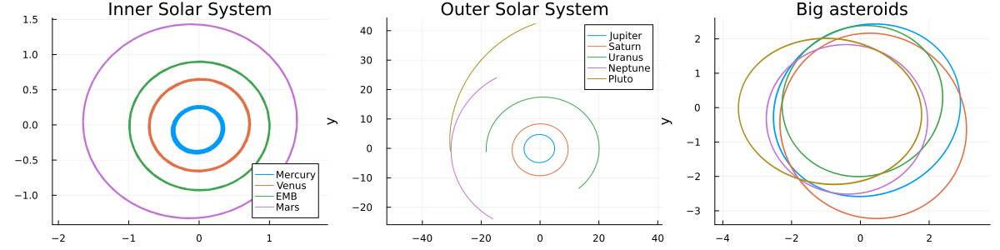

In [9]:
pl1 = plot(title="Inner Solar System", 
            xlabel="x", ylabel="y",  aspect_ratio=1)

for j = 2:5
    x  = [u[1,j,1] for u in sol2.u]
    y  = [u[2,j,1] for u in sol2.u] 
    pl1 = plot!(x,y, label=bodylist[j]) 
end 


pl2 = plot(title="Outer Solar System", 
            xlabel="x", ylabel="y",  aspect_ratio=1)

for j = 6:10
    x  = [u[1,j,1] for u in sol2.u]
    y  = [u[2,j,1] for u in sol2.u] 
    pl2 = plot!(x,y, label=bodylist[j]) 
end 


pl3 = plot(title="Big asteroids", 
            xlabel="x", ylabel="y",  aspect_ratio=1)

for j = 11:15
    x  = [u[1,j,1] for u in sol2.u]
    y  = [u[2,j,1] for u in sol2.u] 
    pl3 = plot!(x,y, 
        label="")
end 


plot(pl1,pl2,pl3, layout=(1,3), size=(1200,300))

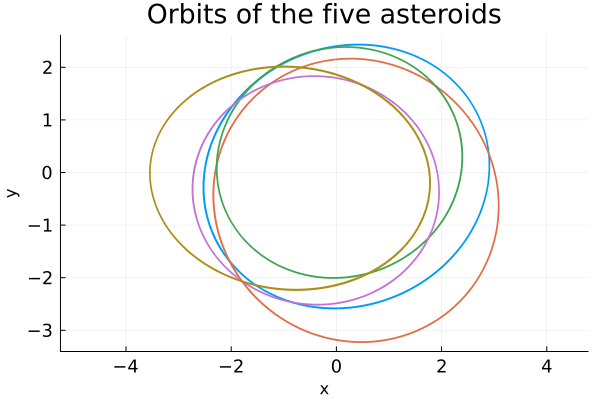

In [10]:
pl3 = plot(title="Orbits of the five asteroids", 
            xlabel="x", ylabel="y",  aspect_ratio=1,
            titlefontsize=18,
            xtickfont = font(12), 
            ytickfont = font(12)
)


for j = 11:15
    x  = [u[1,j,1] for u in sol2.u]
    y  = [u[2,j,1] for u in sol2.u]
    pl3 = plot!(x,y, label="")
end 


plot(pl3)

In [11]:
savefig("./Figures/Fig1.pdf")

"/home/mikel/Mahaigaina/Work-2023-2024/PIC/PIC-2023-2024/Softwarea/2-IRKGL_SIMD/IRKGL_rebersiblea (nbody)/inplementazioa/Juliacon2024/notebook/Figures/Fig1.pdf"

### 2-DPRKN12

In [12]:
tol=fltype(1e-14)

alg= DPRKN12()
dt0=fltype(10.)
sol3=solve(prob2nd, alg,  adaptive=true, dt = dt0, abstol=tol, reltol=tol,  maxiters=1e8, save_everystep=true);
sol3.retcode

ReturnCode.Success = 1

**Convert solution data** to be easy comparison with NbodyIRKGL16

In [13]:
m=1
steps=sol3.stats.naccept 
nreject=sol3.stats.nreject
output=length(sol3.t)
nprint=Int(ceil(output/m)) 

nk=length(sol3.t)
etype=eltype(u0)
sol3u=Vector{Array{etype, 3}}(undef,nprint)
sol3t=Vector{etype}(undef,nprint)
uk=copy(u0)


for k in 1:m:nk
    k1=Int(ceil(k/m))
    uk[:,:,1]=sol3.u[k].x[2]
    uk[:,:,2]=sol3.u[k].x[1]
    sol3u[k1]=copy(uk)
    sol3t[k1]=sol3.t[k]
end
   

In [14]:
if timing
   @btime solve(prob2nd, alg,  adaptive=true, dt = dt0,  abstol=tol, reltol=tol, save_everystep=false)
   @show sol3.stats.naccept
end

  44.872 ms (73654 allocations: 1.40 MiB)
sol3.stats.naccept = 5250


5250

### Error in Energy

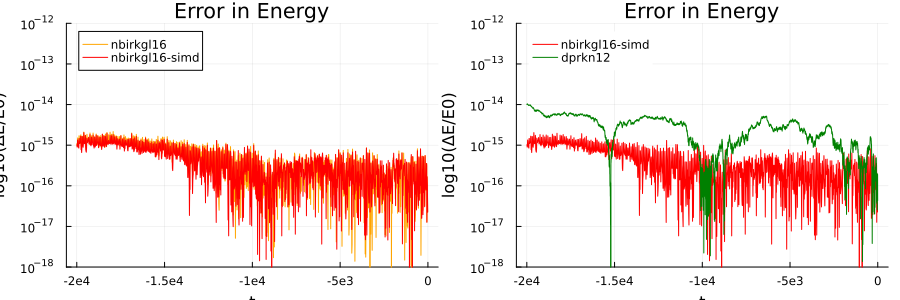

In [15]:
yrange=(1e-18,1e-12)

E0=NbodyEnergy(BigFloat.(u0), BigFloat.(Gm))
ΔE1 = map(x->NbodyEnergy(BigFloat.(x),BigFloat.(Gm)), sol1.u)./E0.-1
ΔE2 = map(x->NbodyEnergy(BigFloat.(x),BigFloat.(Gm)), sol2.u)./E0.-1
ΔE3 = map(x->NbodyEnergy(BigFloat.(x),BigFloat.(Gm)), sol3u)./E0.-1


pl1=plot(title="Error in Energy", xlabel="t", ylabel="log10(ΔE/E0)",
        yscale=:log10,
        xticks=([-2e4,-1.5e4,-1e4,-5e3, 0],["-2e4","-1.5e4","-1e4","-5e3", "0"]),
        legend=:topleft, ylims=yrange)

plot!(pl1,sol1.t[2:end-1],abs.(ΔE1[2:end-1]), color=:orange, label="nbirkgl16")
plot!(pl1,sol2.t[2:end-1],abs.(ΔE2[2:end-1]), color=:red, label="nbirkgl16-simd")

pl2=plot(title="Error in Energy", xlabel="t", ylabel="log10(ΔE/E0)",
        yscale=:log10,
        xticks=([-2e4,-1.5e4,-1e4,-5e3, 0],["-2e4","-1.5e4","-1e4","-5e3", "0"]),
        legend=:topleft, ylims=yrange)

plot!(pl2,sol2.t[2:end-1],abs.(ΔE2[2:end-1]), color=:red, label="nbirkgl16-simd", fg_legend = :false)
plot!(pl2,sol3t[2:end-1],abs.(ΔE3[2:end-1]), color=:green, label="dprkn12", fg_legend = :false)

plot(pl1, pl2, layout=(1,2), size=(900,300))

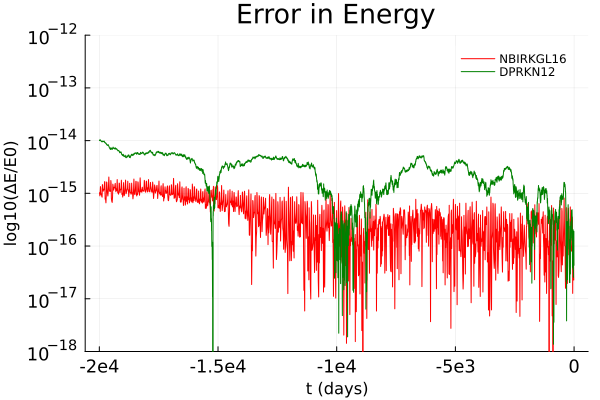

In [16]:
pl2=plot(title="Error in Energy", xlabel="t (days)", ylabel="log10(ΔE/E0)",
        titlefontsize=18,
        xtickfont = font(12),
        ytickfont = font(12),
        xticks=([-2e4,-1.5e4,-1e4,-5e3, 0],["-2e4","-1.5e4","-1e4","-5e3", "0"]),
        yscale=:log10,
        legend=:topright, ylims=yrange)

plot!(pl2,sol2.t[2:end-1],abs.(ΔE2[2:end-1]), color=:red, label="NBIRKGL16", fg_legend = :false)
plot!(pl2,sol3t[2:end-1],abs.(ΔE3[2:end-1]), color=:green, label="DPRKN12", fg_legend = :false)

In [17]:
savefig("./Figures/Fig11.pdf")

"/home/mikel/Mahaigaina/Work-2023-2024/PIC/PIC-2023-2024/Softwarea/2-IRKGL_SIMD/IRKGL_rebersiblea (nbody)/inplementazioa/Juliacon2024/notebook/Figures/Fig11.pdf"

### Close encounters between asteroids

In [18]:
n=length(sol1.t)
dist=Array{Vector{Float64}}(undef,5,5)
for i in 1:5
    for j in 1:5
        dist[i,j]=zeros(n)
    end
end

for i in 1:5
    ix=10+i        # indices for asteroids: 11:15
    A=[u[:,ix,1]  for u in sol1.u]
    for j in i+1:5
        jx=10+j   # indices for asteroids: 11:15
        B=[u[:,jx,1]  for u in sol1.u]
        dist[i,j]=map(x->norm(x), A-B)
    end
end

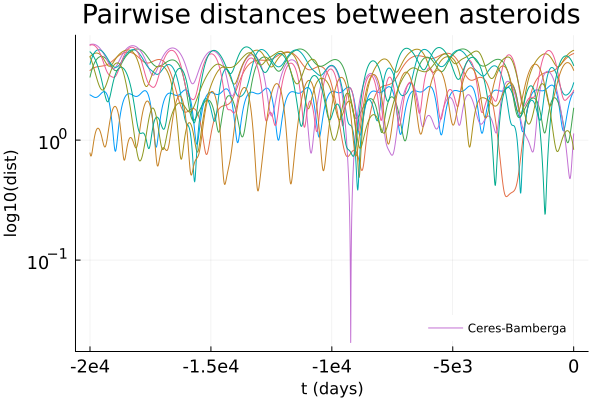

In [19]:
pl1 = plot(title="Pairwise distances between asteroids", 
           titlefontsize=18,
           xtickfont = font(12),
           ytickfont = font(12),
           yscale=:log10,
           legend=:bottomright,
                   xticks=([-2e4,-1.5e4,-1e4,-5e3, 0],["-2e4","-1.5e4","-1e4","-5e3", "0"]),
           xlabel="t (days)", ylabel="log10(dist)")


for i in 1:5
    for j in i+1:5
        if (i==1 && j==5)
             plot!(pl1, sol1.t,dist[i,j], label="Ceres-Bamberga", fg_legend = :false)
        else
            plot!(pl1, sol1.t,dist[i,j], label="")
        end
    end
end

plot(pl1)

In [20]:
savefig("./Figures/Fig2.pdf")

"/home/mikel/Mahaigaina/Work-2023-2024/PIC/PIC-2023-2024/Softwarea/2-IRKGL_SIMD/IRKGL_rebersiblea (nbody)/inplementazioa/Juliacon2024/notebook/Figures/Fig2.pdf"

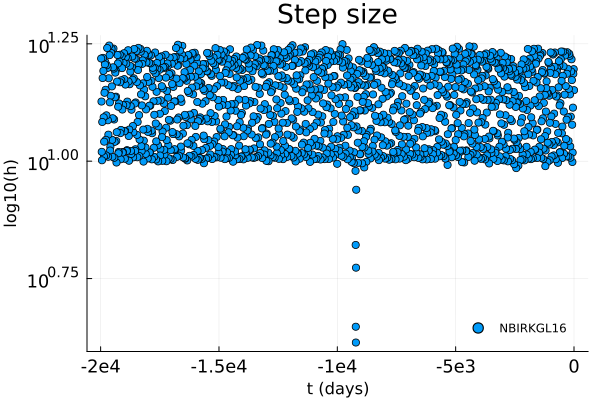

In [21]:
pl2= scatter(title="Step size",
           titlefontsize=18,
           xtickfont = font(12),
          ytickfont = font(12),
           yscale=:log10,
          xticks=([-2e4,-1.5e4,-1e4,-5e3, 0],["-2e4","-1.5e4","-1e4","-5e3", "0"]),
          xlabel="t (days)", ylabel="log10(h)",
          sol2.t[1:end-2],
          label="NBIRKGL16", fg_legend = :false,
          abs.(sol1.t[2:end-1].-sol1.t[1:end-2]))

In [22]:
savefig("./Figures/Fig3.pdf")

"/home/mikel/Mahaigaina/Work-2023-2024/PIC/PIC-2023-2024/Softwarea/2-IRKGL_SIMD/IRKGL_rebersiblea (nbody)/inplementazioa/Juliacon2024/notebook/Figures/Fig3.pdf"

##### <a href="#top">Back to the top</a>

## Error in position

### BigFloat computations

In [23]:
fltype=BigFloat
u0, Gm, bodylist = Initial15Body(fltype)
N = length(Gm)
q0=u0[:,:,1]
v0=u0[:,:,2]
show(bodylist)

["Sun" "Mercury" "Venus" "EMB" "Mars" "Jupiter" "Saturn" "Uranus" "Neptune" "Pluto" "Ceres" "Pallas" "Vesta" "Iris" "Bamberga"]

In [24]:
t0=fltype(0.)   
tF=fltype(-2e4)

tspan= (t0,tF)
prob = ODEProblem(NbodyODE_with_step_size!, u0,tspan , Gm)
prob2nd = SecondOrderODEProblem(NbodyODE2nd!,v0,q0,tspan,Gm);          # DPRKN12

#### 1-Exact solution for NBIRKGL16

In [25]:
tol=fltype(1e-16)

alg= DPRKN12()
dt0=fltype(10.)
sol2_=solve(prob2nd, alg,  adaptive=true, dt = dt0, abstol=tol, reltol=tol,  maxiters=1e8, 
             saveat=sol2.t, tstops=sol2.t);

sol2_.retcode

ReturnCode.Success = 1

**Convert solution data** to be easy comparison with NbodyIRKGL16

steps=10754, nreject=3, output=1488, m=1, nprint=1488


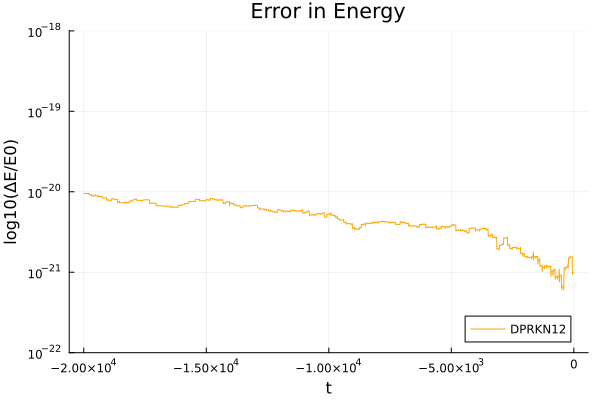

In [26]:
m=1
steps=sol2_.stats.naccept 
nreject=sol2_.stats.nreject
output=length(sol2_.t)
nprint=Int(ceil(output/m)) 
println("steps=$steps, nreject=$nreject, output=$output, m=$m, nprint=$nprint")

nk=length(sol2_.t)
etype=eltype(u0)
sol2_u=Vector{Array{etype, 3}}(undef,nprint)
sol2_t=Vector{etype}(undef,nprint)
uk=copy(u0)


for k in 1:m:nk
    k1=Int(ceil(k/m))
    uk[:,:,1]=sol2_.u[k].x[2]
    uk[:,:,2]=sol2_.u[k].x[1]
    sol2_u[k1]=copy(uk)
    sol2_t[k1]=sol2_.t[k]
end
   
E0=NbodyEnergy(BigFloat.(u0), BigFloat.(Gm))
ΔE2_ = map(x->NbodyEnergy(BigFloat.(x),BigFloat.(Gm)), sol2_u)./E0.-1;

yrange=(1e-22,1e-18)


pl1=plot(title="Error in Energy", xlabel="t", ylabel="log10(ΔE/E0)",
        yscale=:log10,
        legend=:bottomright,
        ylims=yrange
)

plot!(pl1,sol2_t[2:end-1],abs.(ΔE2_[2:end-1]), color=:orange, label="DPRKN12")

#### 2- Exact solution for DPRKN12

In [27]:
tol=fltype(1e-16)

alg= DPRKN12()
dt0=fltype(10.)
sol3_=solve(prob2nd, alg,  adaptive=true, dt = dt0, abstol=tol, reltol=tol,  maxiters=1e8, 
             saveat=sol3.t, tstops=sol3.t);

sol3_.retcode

ReturnCode.Success = 1

**Convert solution data** to be easy comparison with NbodyIRKGL16

steps=14807, nreject=2, output=5251, m=1, nprint=5251


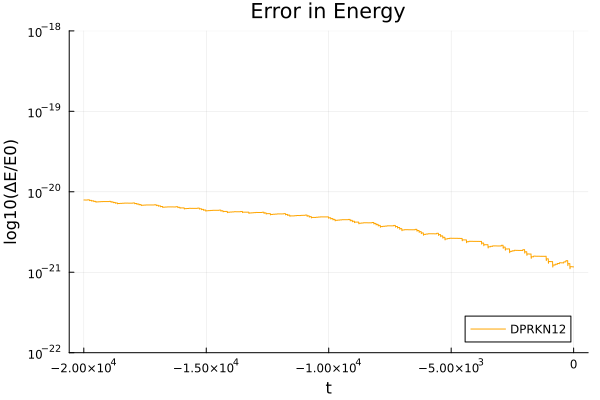

In [28]:
m=1
steps=sol3_.stats.naccept 
nreject=sol3_.stats.nreject
output=length(sol3_.t)
nprint=Int(ceil(output/m)) 
println("steps=$steps, nreject=$nreject, output=$output, m=$m, nprint=$nprint")


nk=length(sol3_.t)
etype=eltype(u0)
sol3_u=Vector{Array{etype, 3}}(undef,nprint)
sol3_t=Vector{etype}(undef,nprint)
uk=copy(u0)


for k in 1:m:nk
    k1=Int(ceil(k/m))
    uk[:,:,1]=sol3_.u[k].x[2]
    uk[:,:,2]=sol3_.u[k].x[1]
    sol3_u[k1]=copy(uk)
    sol3_t[k1]=sol3_.t[k]
end
   
E0=NbodyEnergy(BigFloat.(u0), BigFloat.(Gm))
ΔE3_ = map(x->NbodyEnergy(BigFloat.(x),BigFloat.(Gm)), sol3_u)./E0.-1;

yrange=(1e-22,1e-18)


pl1=plot(title="Error in Energy", xlabel="t", ylabel="log10(ΔE/E0)",
        yscale=:log10,
        legend=:bottomright,
        ylims=yrange
)

plot!(pl1,sol3_t[2:end-1],abs.(ΔE3_[2:end-1]), color=:orange, label="DPRKN12")

### Graphics

#### 1-Graphics for NBIRKGL16

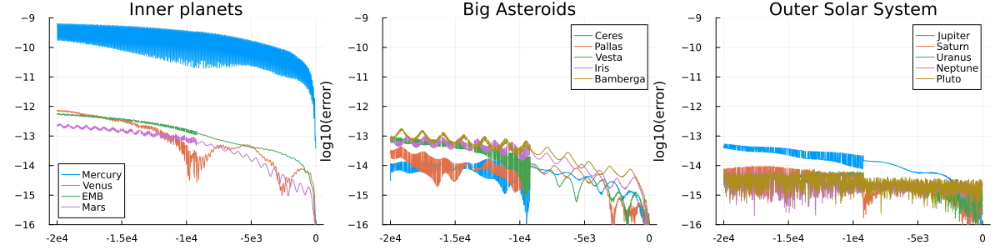

In [29]:
err=(sol2.u-sol2_u)
qe=Array{Array{Float64,1}}(undef,N)
for i in 1:N
    qe[i]=map(x->log10(norm(x[:,i,1])),err[2:end])
end

yrange=(-16,-9)

pl1= plot(sol2.t[2:end],qe[2:5],
     ylims=yrange,
     title="Inner planets",
     label=bodylist[:,2:5],
     xticks=([-2e4,-1.5e4,-1e4,-5e3, 0],["-2e4","-1.5e4","-1e4","-5e3", "0"]),
     xlabel="t", ylabel="log10(error)")


pl2= plot(sol2.t[2:end],qe[11:15],
     ylims=yrange,
     title="Big Asteroids",
     label=bodylist[:,11:15],
      xticks=([-2e4,-1.5e4,-1e4,-5e3, 0],["-2e4","-1.5e4","-1e4","-5e3", "0"]),
       xlabel="t", ylabel="log10(error)")

pl3= plot(sol2.t[2:end],qe[6:10],
     ylims=yrange,
     title="Outer Solar System",
     label=bodylist[:,6:10],
     xticks=([-2e4,-1.5e4,-1e4,-5e3, 0],["-2e4","-1.5e4","-1e4","-5e3", "0"]),
     xlabel="t", ylabel="log10(error)")


plot(pl1,pl2,pl3, layout=(1,3), size=(1200,300))

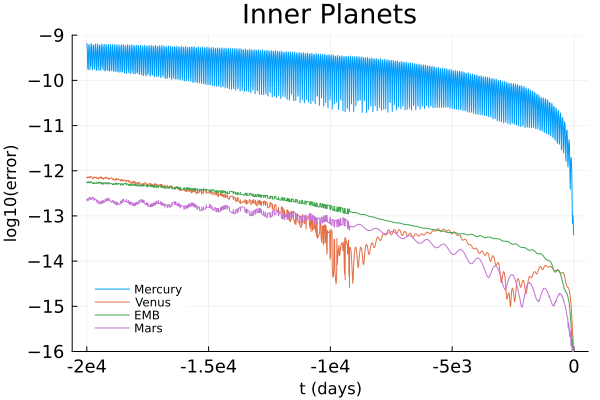

In [30]:
pl1= plot(sol2.t[2:end],qe[2:5],
     titlefontsize=18,
     xtickfont = font(12),
     ytickfont = font(12),
     xticks=([-2e4,-1.5e4,-1e4,-5e3, 0],["-2e4","-1.5e4","-1e4","-5e3", "0"]),
     ylims=yrange,
     title="Inner Planets",   
     label=bodylist[:,2:5], fg_legend = :false, 
     xlabel="t (days)", ylabel="log10(error)")

plot(pl1)


In [31]:
savefig("./Figures/Fig21.pdf")

"/home/mikel/Mahaigaina/Work-2023-2024/PIC/PIC-2023-2024/Softwarea/2-IRKGL_SIMD/IRKGL_rebersiblea (nbody)/inplementazioa/Juliacon2024/notebook/Figures/Fig21.pdf"

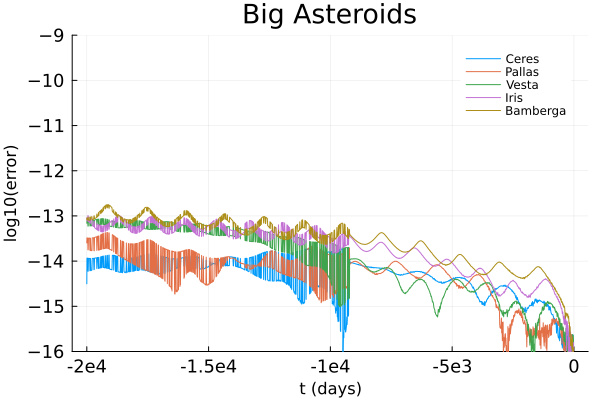

In [32]:
pl2= plot(sol2.t[2:end],qe[11:15],
     titlefontsize=18,
     xtickfont = font(12),
     ytickfont = font(12),
     xticks=([-2e4,-1.5e4,-1e4,-5e3, 0],["-2e4","-1.5e4","-1e4","-5e3", "0"]),
     ylims=yrange,
     title="Big Asteroids",   
     label=bodylist[:,11:15], fg_legend = :false,
     xlabel="t (days)", ylabel="log10(error)")

plot(pl2)

In [33]:
savefig("./Figures/Fig22.pdf")

"/home/mikel/Mahaigaina/Work-2023-2024/PIC/PIC-2023-2024/Softwarea/2-IRKGL_SIMD/IRKGL_rebersiblea (nbody)/inplementazioa/Juliacon2024/notebook/Figures/Fig22.pdf"

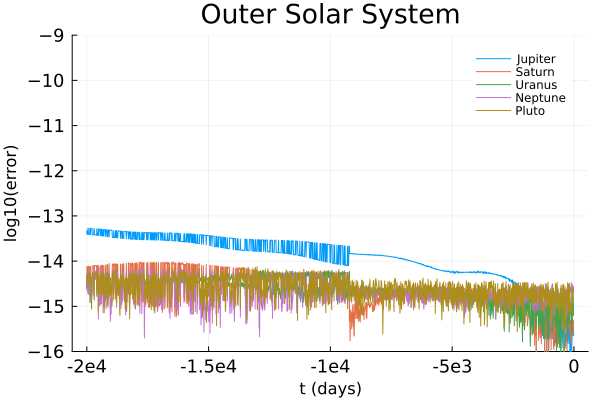

In [34]:
pl3= plot(sol2.t[2:end],qe[6:10],
     ylims=yrange,
     title="Outer Solar System",
     label=bodylist[:,6:10],  fg_legend = :false, 
     titlefontsize=18,
     xtickfont = font(12),
     ytickfont = font(12),
     xticks=([-2e4,-1.5e4,-1e4,-5e3, 0],["-2e4","-1.5e4","-1e4","-5e3", "0"]),
     xlabel="t (days)", ylabel="log10(error)")

plot(pl3)

In [35]:
savefig("./Figures/Fig23.pdf")

"/home/mikel/Mahaigaina/Work-2023-2024/PIC/PIC-2023-2024/Softwarea/2-IRKGL_SIMD/IRKGL_rebersiblea (nbody)/inplementazioa/Juliacon2024/notebook/Figures/Fig23.pdf"

#### 2- Graphics for DPRKN12

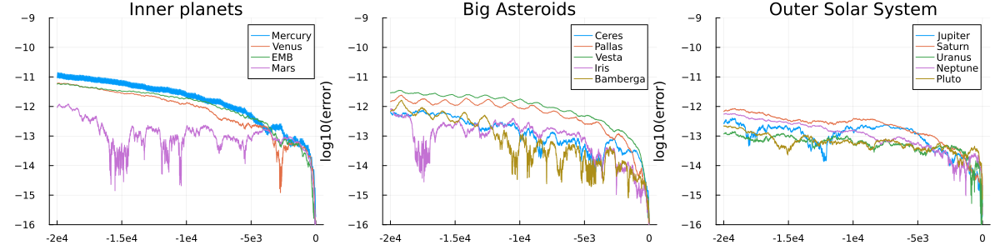

In [36]:
err=(sol3u-sol3_u)
qe=Array{Array{Float64,1}}(undef,N)
for i in 1:N
    qe[i]=map(x->log10(norm(x[:,i,1])),err[2:end])
end

yrange=(-16,-9)

pl1= plot(sol3t[2:end],qe[2:5],
     ylims=yrange,
     title="Inner planets",
     label=bodylist[:,2:5],
     xticks=([-2e4,-1.5e4,-1e4,-5e3, 0],["-2e4","-1.5e4","-1e4","-5e3", "0"]),
     xlabel="t", ylabel="log10(error)")


pl2= plot(sol3t[2:end],qe[11:15],
     ylims=yrange,
     title="Big Asteroids",
     label=bodylist[:,11:15],
     xticks=([-2e4,-1.5e4,-1e4,-5e3, 0],["-2e4","-1.5e4","-1e4","-5e3", "0"]),
     xlabel="t", ylabel="log10(error)")

pl3= plot(sol3t[2:end],qe[6:10],
     ylims=yrange,
     title="Outer Solar System",
     label=bodylist[:,6:10],
     xticks=([-2e4,-1.5e4,-1e4,-5e3, 0],["-2e4","-1.5e4","-1e4","-5e3", "0"]),
     xlabel="t", ylabel="log10(error)")


plot(pl1,pl2,pl3, layout=(1,3), size=(1200,300))

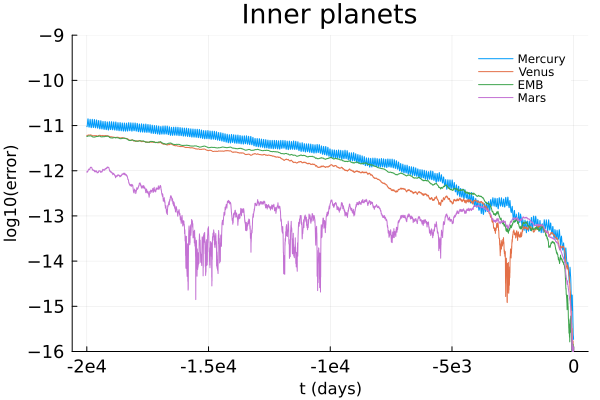

In [37]:
pl1= plot(sol3t[2:end],qe[2:5],
     ylims=yrange,
     title="Inner planets",
     label=bodylist[:,2:5], fg_legend = :false, 
     titlefontsize=18,
     xtickfont = font(12),
     ytickfont = font(12),
     xticks=([-2e4,-1.5e4,-1e4,-5e3, 0],["-2e4","-1.5e4","-1e4","-5e3", "0"]),
     xlabel="t (days)", ylabel="log10(error)")

plot(pl1)

In [38]:
savefig("./Figures/Fig31.pdf")

"/home/mikel/Mahaigaina/Work-2023-2024/PIC/PIC-2023-2024/Softwarea/2-IRKGL_SIMD/IRKGL_rebersiblea (nbody)/inplementazioa/Juliacon2024/notebook/Figures/Fig31.pdf"

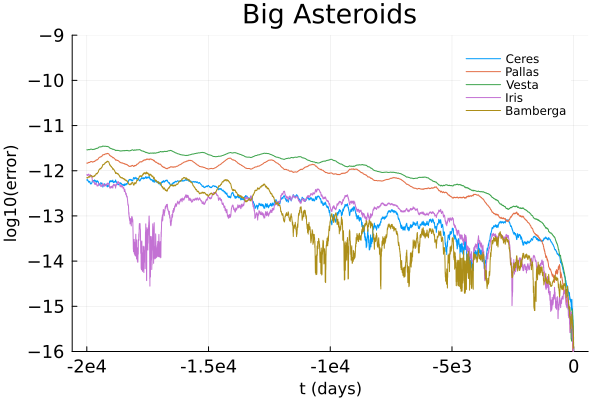

In [39]:
pl2= plot(sol3t[2:end],qe[11:15],
     ylims=yrange,
     title="Big Asteroids",
     label=bodylist[:,11:15],fg_legend = :false, 
     titlefontsize=18,
     xtickfont = font(12),
     ytickfont = font(12),
     xticks=([-2e4,-1.5e4,-1e4,-5e3, 0],["-2e4","-1.5e4","-1e4","-5e3", "0"]),
     xlabel="t (days)", ylabel="log10(error)")

plot(pl2)

In [40]:
savefig("./Figures/Fig32.pdf")

"/home/mikel/Mahaigaina/Work-2023-2024/PIC/PIC-2023-2024/Softwarea/2-IRKGL_SIMD/IRKGL_rebersiblea (nbody)/inplementazioa/Juliacon2024/notebook/Figures/Fig32.pdf"

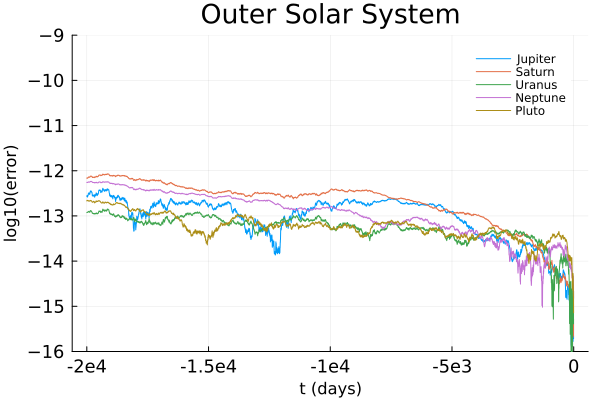

In [41]:
pl3= plot(sol3t[2:end],qe[6:10],
     ylims=yrange,
     title="Outer Solar System",
     label=bodylist[:,6:10], fg_legend = :false, 
      titlefontsize=18,
     xtickfont = font(12),
     ytickfont = font(12),
     xticks=([-2e4,-1.5e4,-1e4,-5e3, 0],["-2e4","-1.5e4","-1e4","-5e3", "0"]),
     xlabel="t (days)", ylabel="log10(error)")

plot(pl3)

In [42]:
savefig("./Figures/Fig33.pdf")

"/home/mikel/Mahaigaina/Work-2023-2024/PIC/PIC-2023-2024/Softwarea/2-IRKGL_SIMD/IRKGL_rebersiblea (nbody)/inplementazioa/Juliacon2024/notebook/Figures/Fig33.pdf"